In [ ]:
import os
# import wget
import cv2
import numpy as np

In [ ]:
# creating a directory for YOLOv3 files if it doesn't already exist
yolo_directory = "yolov3_files"
os.makedirs(yolo_directory, exist_ok=True)

In [ ]:
%pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=4438f27c726e699b09987872f7c2b3f3afcc0c05e9d71fb0b3c7c5dac278bc10
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
import wget

In [ ]:
# downloading the YOLOv3 weights, configuration, and class names from URLs
weights_url = "https://pjreddie.com/media/files/yolov3.weights"
weights_file = os.path.join(yolo_directory, "yolov3.weights")
wget.download(weights_url, weights_file)

config_url = "https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true"
config_file = os.path.join(yolo_directory, "yolov3.cfg")
wget.download(config_url, config_file)

names_url = "https://github.com/pjreddie/darknet/blob/master/data/coco.names?raw=true"
names_file = os.path.join(yolo_directory, "coco.names")
wget.download(names_url, names_file)

'yolov3_files/coco.names'

In [ ]:
# loading the YOLO model and class names
net = cv2.dnn.readNet(weights_file, config_file)
classes = []
with open(names_file, "r") as f:
    classes = [line.strip() for line in f.readlines()]

In [ ]:
# getting the names of the unconnected output layers
layer_names = net.getUnconnectedOutLayersNames()

In [ ]:
# loading the video
video_path = "/content/480p_chinkara.mp4"
cap = cv2.VideoCapture(video_path)

In [ ]:
from google.colab.patches import cv2_imshow

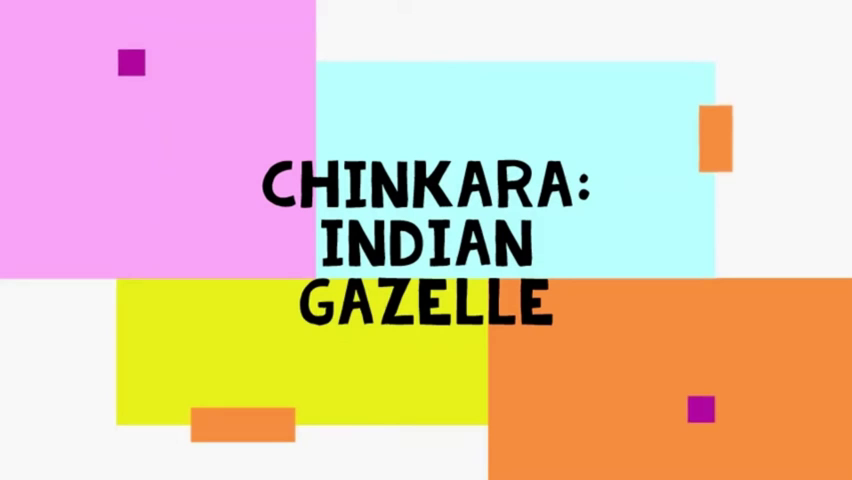

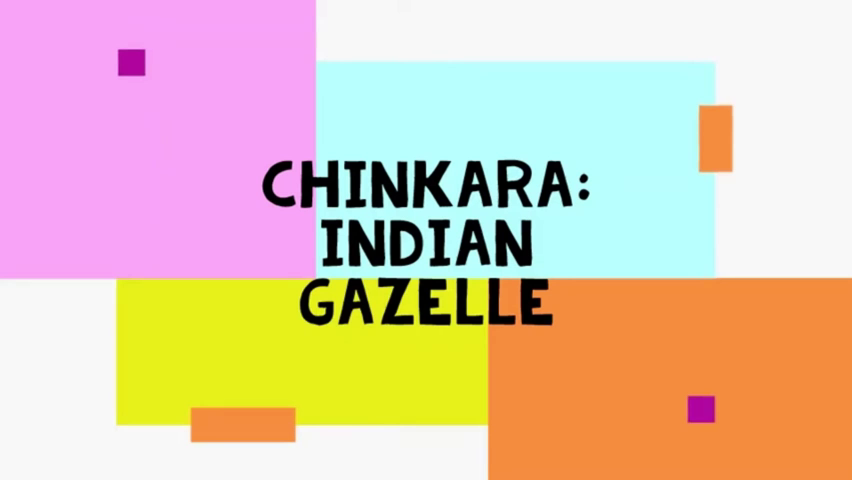

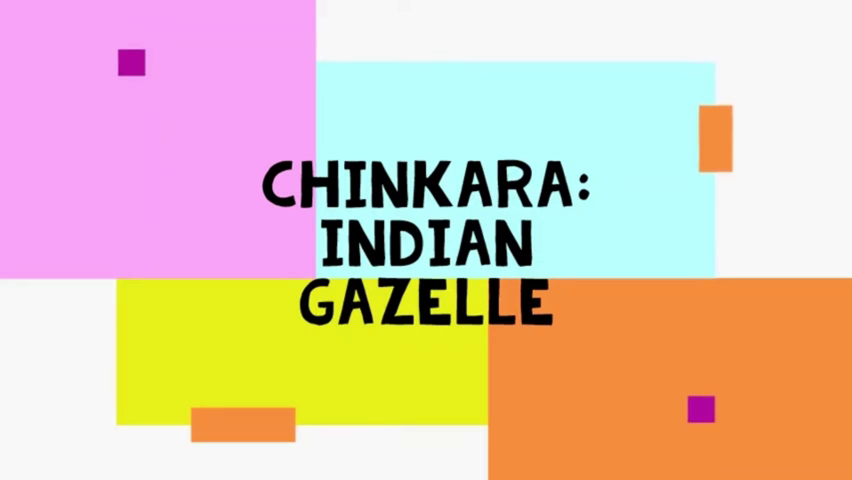

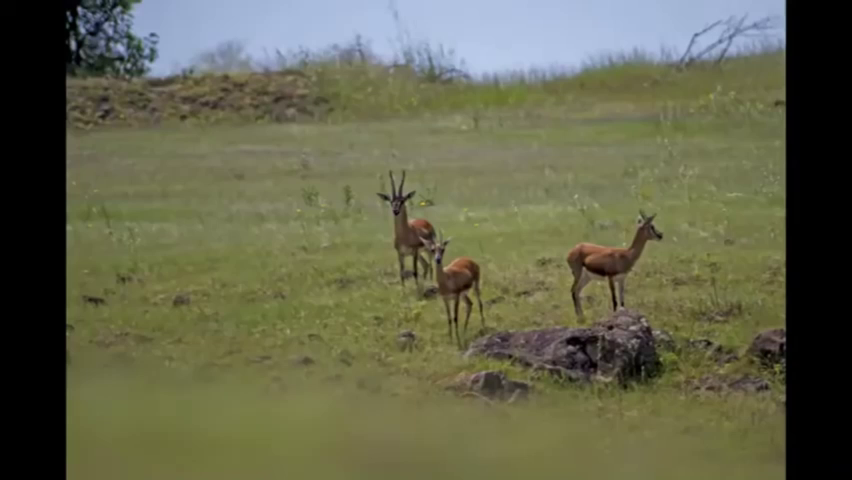

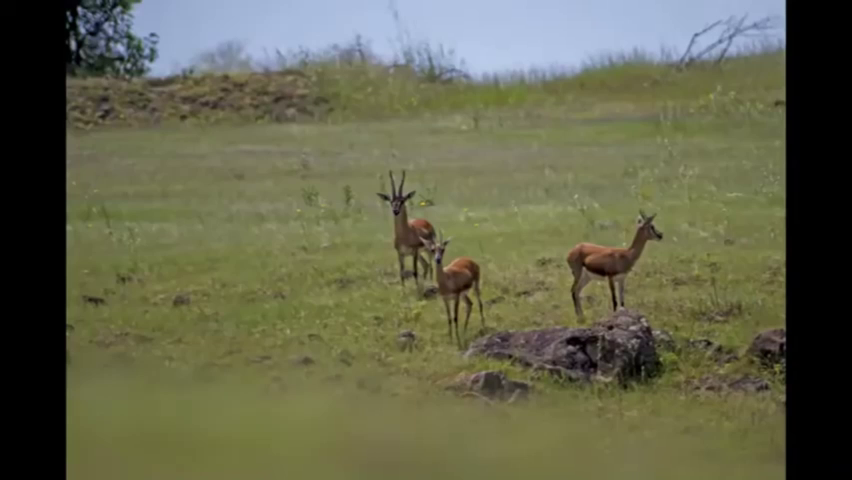

...

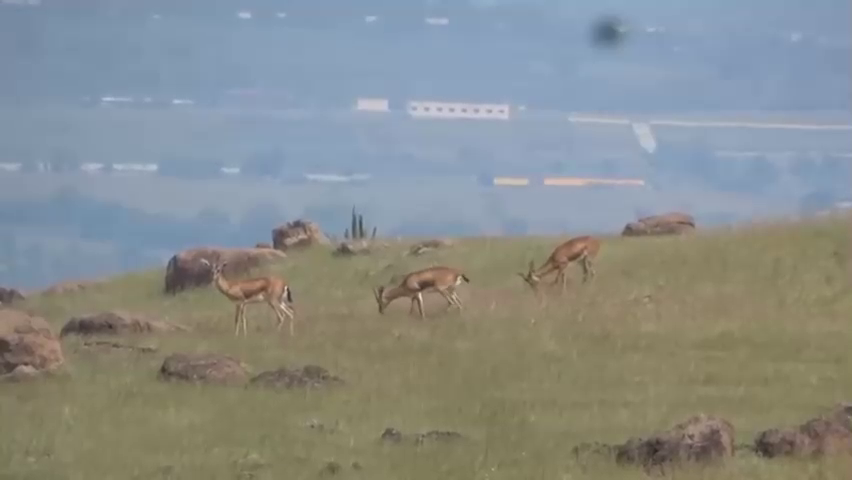

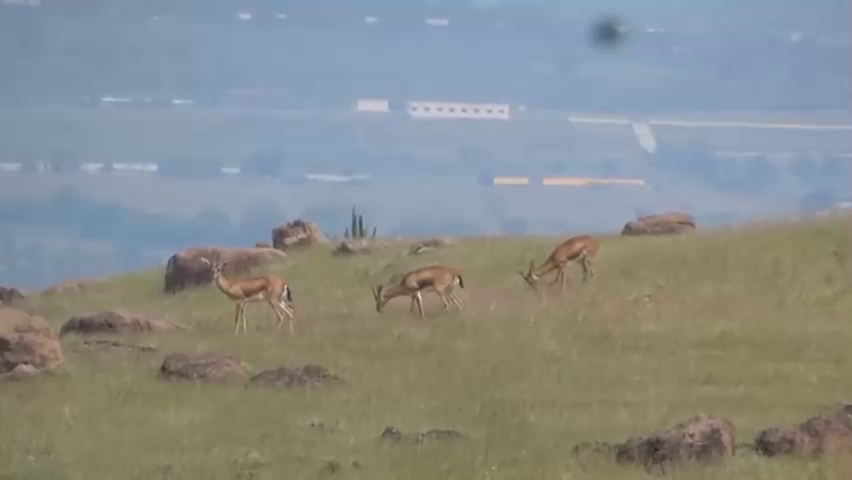

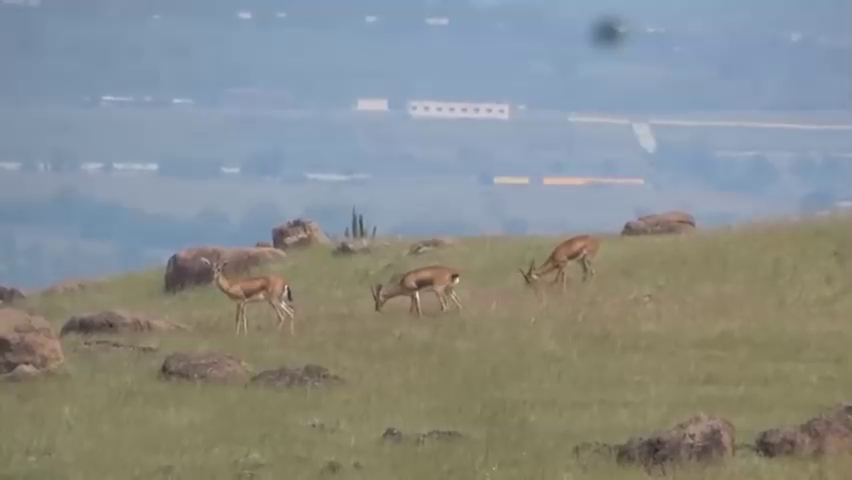

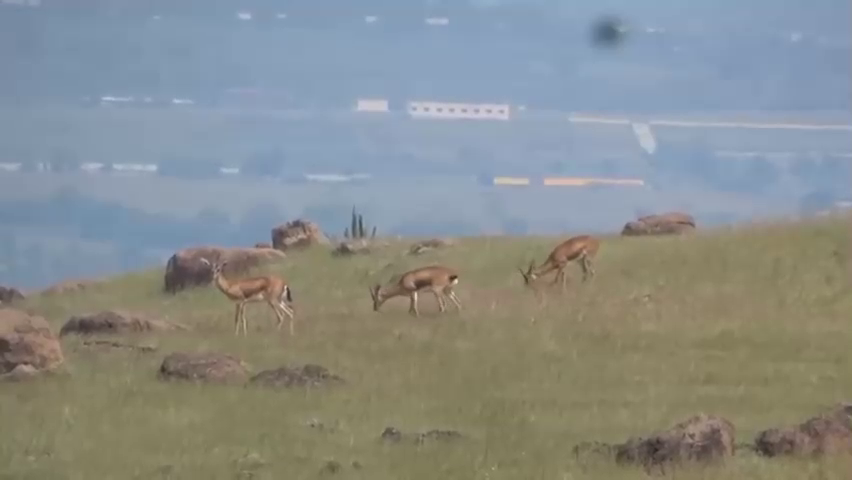

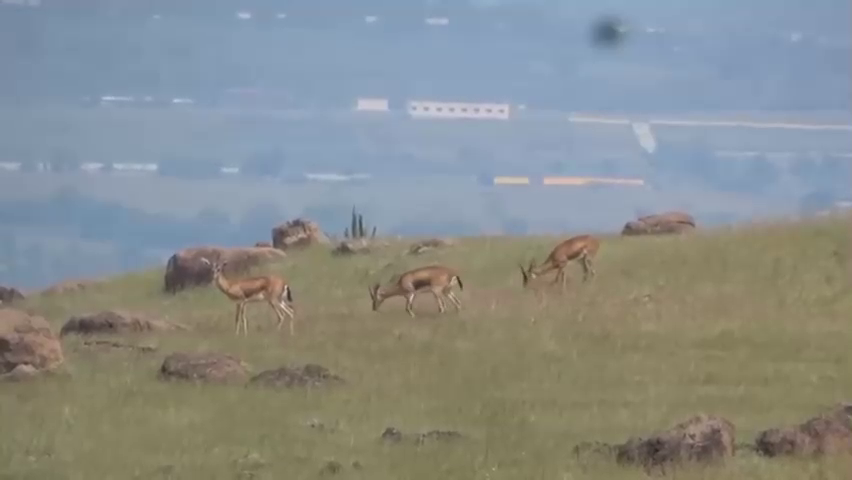

In [ ]:
# processing each frame in the video
while True:
    ret, frame = cap.read()
    if not ret:
        break

    height, width, _ = frame.shape

    # converting frame to a blob
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(layer_names)

    class_ids = []
    confidences = []
    boxes = []

    # processing detections
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5 and classes[class_id] == "dog":
                # calculating box dimensions
                center_x, center_y, w, h = (detection[0:4] * np.array([width, height, width, height])).astype('int')
                x, y = int(center_x - w / 2), int(center_y - h / 2)

                # saving the detections
                class_ids.append(class_id)
                confidences.append(float(confidence))
                boxes.append([x, y, w, h])

    # applying non-max suppression
    indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    # drawing bounding boxes on the frame
    for i in indices:
      # ensuring i is an integer by converting potential list to scalar if needed
      if type(i) == list:
          i = i[0]
      box = boxes[i]
      x, y, w, h = box
      cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)

    cv2_imshow(frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()